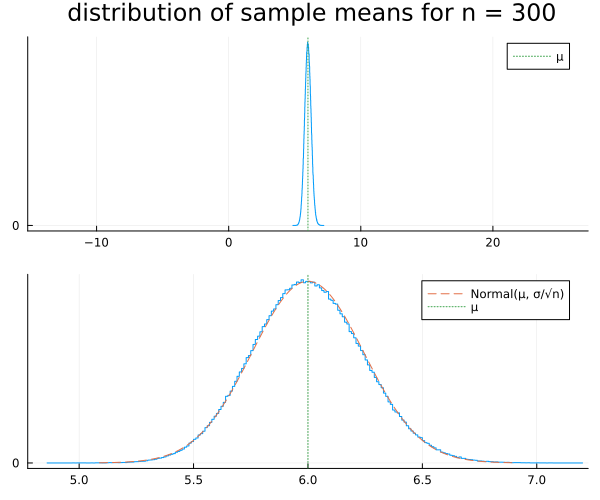

In [1]:
using Distributions
using StatsPlots
default(fmt=:png)

dist = Gamma(2, 3)
μ, σ = mean(dist), std(dist)
n = 300

L = 10^6
X̄ = zeros(L)
Threads.@threads for i in 1:L
    X = rand(dist, n)
    X̄[i] = mean(X)
end

P = stephist(X̄; norm=true, label="")
plot!(xlim=(μ-5σ, μ+5σ))
vline!([μ]; label="μ", ls=:dot, c=3)
plot!(ytick=[0])

Q = stephist(X̄; norm=true, label="")
plot!(xlim=(μ-5σ/√n, μ+5σ/√n))
plot!(Normal(μ, σ/√n); label="Normal(μ, σ/√n)", ls=:dash)
vline!([μ]; label="μ", ls=:dot)
plot!(ytick=[0])

plot(P, Q; size=(600, 500), layout=(2, 1))
plot!(plot_title="distribution of sample means for n = $n")

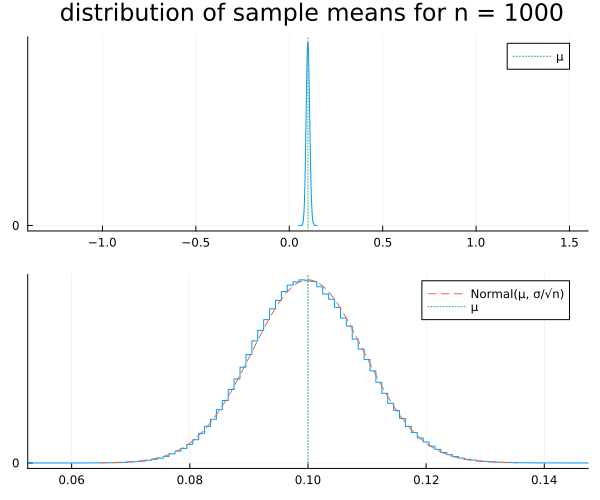

In [2]:
using Distributions
using StatsPlots
default(fmt=:png)

dist = Poisson(1)
dist = Bernoulli(0.1)
m = 5

μ, σ = mean(dist), std(dist)
n = 1000

L = 10^6
X̄ = zeros(L)
Threads.@threads for i in 1:L
    X = rand(dist, n)
    X̄[i] = mean(X)
end

nbin = 101
binmin, binmax = floor(n*(μ-m*σ/√n))/n, ceil(n*(μ+m*σ/√n))/n
binstep = max(1, round(n*(binmax - binmin)/nbin))/n
bin = binmin-binstep/2:binstep:binmax+binstep/2

P = stephist(X̄; norm=true, bin, label="")
plot!(xlim=(μ-m*σ, μ+m*σ))
vline!([μ]; label="μ", ls=:dot, c=3)
plot!(ytick=[0])

Q = stephist(X̄; norm=true, bin, label="")
plot!(xlim=(μ-m*σ/√n, μ+m*σ/√n))
plot!(Normal(μ, σ/√n); label="Normal(μ, σ/√n)", ls=:dash)
vline!([μ]; label="μ", ls=:dot)
plot!(ytick=[0])

plot(P, Q; size=(600, 500), layout=(2, 1))
plot!(plot_title="distribution of sample means for n = $n")

In [3]:
using Distributions
using Random
using StatsPlots
default(fmt=:png)

function plot_lln_clt(; dist=Gamma(2, 3), m=5, nbin=200, L=10^6)
    μ, σ = mean(dist), std(dist)
    ns = round.(Int, exp.(range(log(1), log(1000), 200)))
    nmax = maximum(ns)

    X̄ = zeros(L, length(ns))
    Xtmp = [zeros(eltype(dist), nmax) for _ in 1:Threads.nthreads()]
    @time Threads.@threads for i in 1:L
        X = rand!(dist, Xtmp[Threads.threadid()])
        for (j, n) in enumerate(ns)
            X̄[i, j] = mean(@view(X[1:n]))
        end
    end

    js = collect(eachindex(ns))
    js_gif = [fill(js[begin], 60); js; fill(js[end], 60)]
    ns_gif = ns[js_gif]
    @time @gif for (j, n) in zip(js_gif, ns_gif)
        bin = if dist isa DiscreteUnivariateDistribution
            binmin, binmax = floor(n*(μ-m*σ/√n))/n, ceil(n*(μ+m*σ/√n))/n
            binstep = max(1, round(n*(binmax - binmin)/nbin))/n
            binmin-binstep/2:binstep:binmax+binstep/2
        else
            :auto
        end
        
        P = stephist(@view(X̄[:, j]); norm=true, bin, label="")
        plot!(xlim=(μ-m*σ, μ+m*σ))
        vline!([μ]; label="μ", ls=:dot, c=3)
        title!("law of large numbers (n = $n)"; titlefontsize=12)
        plot!(ytick=[0])

        Q = stephist(@view(X̄[:, j]); norm=true, bin, label="")
        plot!(xlim=(μ-m*σ/√n, μ+m*σ/√n))
        plot!(Normal(μ, σ/√n), μ-m*σ/√n, μ+m*σ/√n; label="Normal(μ, σ/√n)", ls=:dash)
        vline!([μ]; label="μ", ls=:dot)
        title!("central limit theorem (n = $n)"; titlefontsize=12)
        plot!(ytick=[0])

        plot(P, Q; size=(600, 500), layout=(2, 1))
        plot!(plot_title="distribution of sample means for n = $n",
            plot_titlefontsize=14)
    end
end

plot_lln_clt (generic function with 1 method)

  1.076752 seconds (208.15 k allocations: 14.113 MiB, 170.66% compilation time)
 50.981692 seconds (16.69 M allocations: 15.008 GiB, 2.01% gc time, 1.22% compilation time: 21% of which was recompilation)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
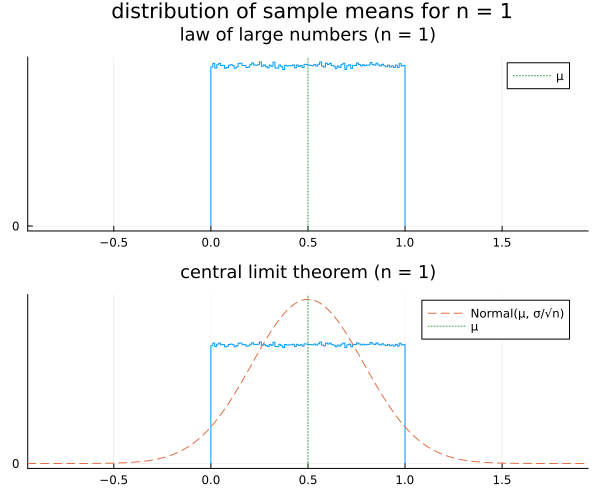

In [4]:
plot_lln_clt(; dist = Uniform())

  4.059890 seconds (64.01 k allocations: 4.303 MiB, 15.60% compilation time)
 50.953712 seconds (21.45 M allocations: 15.081 GiB, 2.02% gc time)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
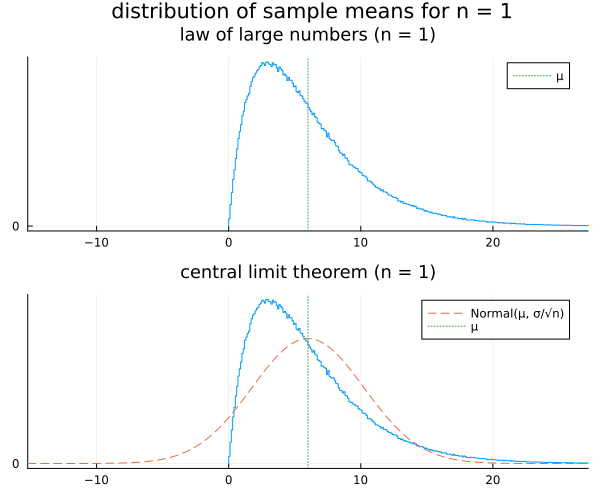

In [5]:
plot_lln_clt(; dist = Gamma(2, 3))

  5.394569 seconds (5.14 M allocations: 406.341 MiB, 28.05% compilation time)
 52.614335 seconds (19.20 M allocations: 15.048 GiB, 2.04% gc time)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
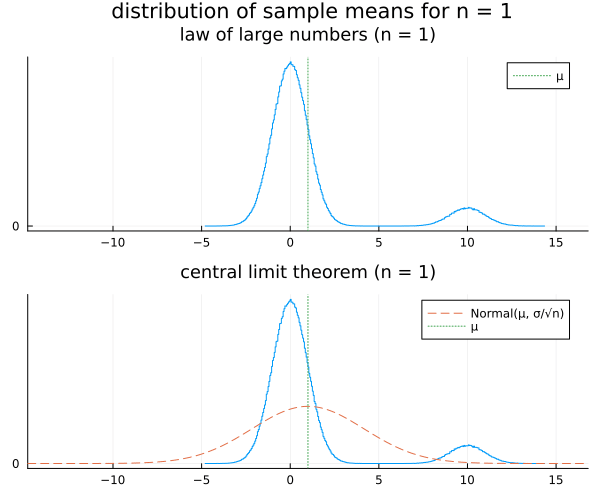

In [6]:
plot_lln_clt(; dist = MixtureModel([Normal(), Normal(10)], [0.9, 0.1]))

  5.172818 seconds (5.00 M allocations: 396.737 MiB)
 54.316595 seconds (27.15 M allocations: 15.198 GiB, 2.19% gc time)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
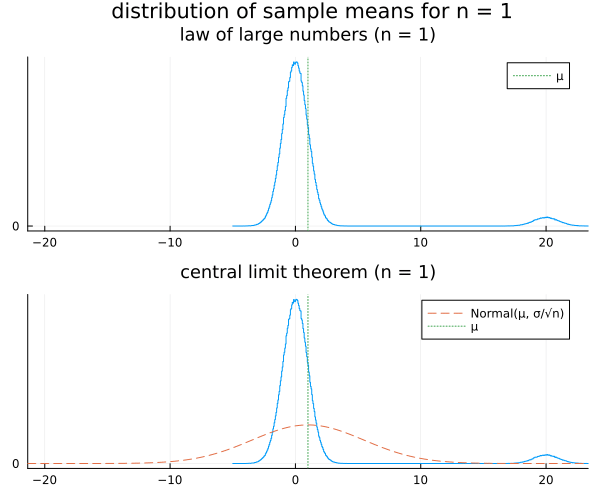

In [7]:
plot_lln_clt(; dist = MixtureModel([Normal(), Normal(20)], [0.95, 0.05]))

  6.212670 seconds (187.34 k allocations: 12.621 MiB, 37.94% compilation time)
 32.507423 seconds (13.34 M allocations: 5.387 GiB, 1.49% gc time)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
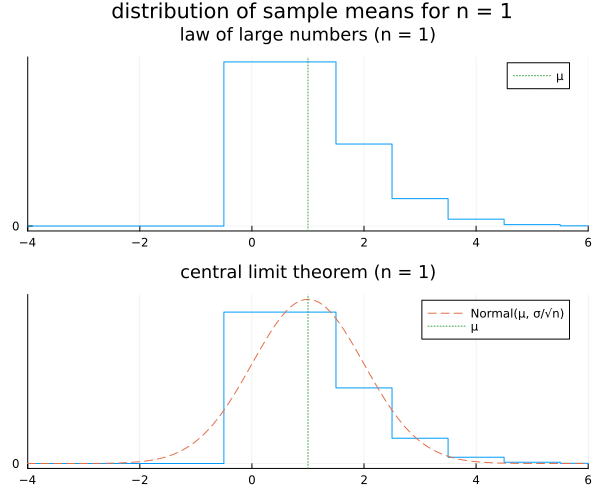

In [8]:
plot_lln_clt(; dist = Poisson(1))

  1.981224 seconds (128.34 k allocations: 8.645 MiB, 79.88% compilation time)
 34.606495 seconds (11.87 M allocations: 5.352 GiB, 1.38% gc time)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
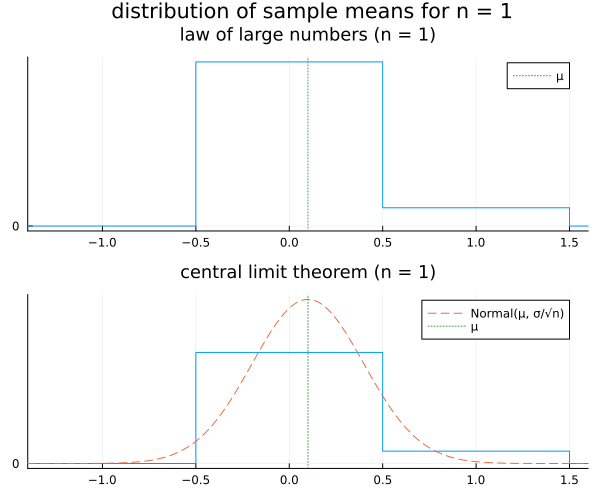

In [9]:
plot_lln_clt(; dist = Bernoulli(0.1))